# 1. Import Libraries

In [1]:
import os 
import opendatasets as od
from pathlib import Path

import pandas as pd
import numpy as np
import re

# Plots 
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import folium

%matplotlib inline

In [2]:
pd.set_option('display.max_columns', None)

# 2. Download Data

In [3]:
od.download("https://www.kaggle.com/competitions/cs5228-2022-semester-1-final-project")

Skipping, found downloaded files in ".\cs5228-2022-semester-1-final-project" (use force=True to force download)


# 3. Configurations

In [4]:
sns.set_theme(style="ticks")
sns.set_context("paper", rc={"xtick.labelsize":15,
                             "ytick.labelsize":15,
                             "axes.titlesize":20,
                             "axes.labelsize":15})
default_col = '#4c72b0'
highlight_col = '#c44d52'

In [5]:
# create a folder for plots
os.makedirs("images", exist_ok=True)

In [6]:
data_dir = Path("./cs5228-2022-semester-1-final-project/")
img_dir = Path("./images/")

In [7]:
def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(img_dir, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In [8]:
def check_shape(data):
    num_points, num_attributes = data.shape
    return print("There are {} data points and {} features".format(num_points, num_attributes))

In [9]:
def highlight_top(ax, orientation):
    if orientation == "horizontal":
        patch_h = [patch.get_width() for patch in ax.patches]
    elif orientation == "vertical":
        patch_h = [patch.get_height() for patch in ax.patches]
    
    max_value = max(patch_h)
    
    # Check if there are more than 1 largest value
    idx_tallest = [i for i, j in enumerate(patch_h) if j == max_value]
        
    for idx in idx_tallest:
        ax.patches[idx].set_facecolor(highlight_col)

# 4. Exploratory Data Analysis

## 4.1 Summary Statistics

In [10]:
df_train = pd.read_csv(Path(data_dir, "train.csv"))

In [11]:
df_train_cleaned = df_train.copy()

In [12]:
df_train_cleaned.head()

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
0,122881,hdb flat for sale in 866 yishun street 81,sembawang / yishun (d27),866 yishun street 81,hdb 4 rooms,NaN,1988.0,3.0,2.0,1115,NaN,unspecified,NaN,116.0,https://www.99.co/singapore/hdb/866-yishun-str...,1.414399,103.837196,0,yishun south,yishun,514500.0
1,259374,hdb flat for sale in 506b serangoon north aven...,hougang / punggol / sengkang (d19),hdb-serangoon estate,hdb,99-year leasehold,1992.0,4.0,2.0,1575,NaN,unspecified,"1, 2, 3, 4, 5, 6 br",NaN,https://www.99.co/singapore/hdb/hdbserangoon-e...,1.372597,103.875625,0,serangoon north,serangoon,995400.0
2,665422,4 bed condo for sale in meyerhouse,128 meyer road,meyerhouse,condo,freehold,2022.0,4.0,6.0,3070,low,partial,"studio, 3, 4, 5, 6 br",56.0,https://www.99.co/singapore/condos-apartments/...,1.298773,103.895798,0,mountbatten,marine parade,8485000.0
3,857699,3 bed condo for sale in leedon green,26 leedon heights,leedon green,Condo,freehold,2023.0,3.0,2.0,958,NaN,partial,"studio, 1, 2, 3, 4 br",638.0,https://www.99.co/singapore/condos-apartments/...,1.312364,103.803271,0,farrer court,bukit timah,2626000.0
4,216061,2 bed condo for sale in one bernam,1 bernam street,one bernam,condo,99-year leasehold,2026.0,2.0,1.0,732,NaN,unspecified,"studio, 1, 2, 3, 4, 5 br",351.0,https://www.99.co/singapore/condos-apartments/...,1.273959,103.843635,0,anson,downtown core,1764000.0


In [13]:
df_train_cleaned.dtypes

listing_id                int64
title                    object
address                  object
property_name            object
property_type            object
tenure                   object
built_year              float64
num_beds                float64
num_baths               float64
size_sqft                 int64
floor_level              object
furnishing               object
available_unit_types     object
total_num_units         float64
property_details_url     object
lat                     float64
lng                     float64
elevation                 int64
subzone                  object
planning_area            object
price                   float64
dtype: object

In [14]:
df_train_cleaned.describe()

,listing_id,built_year,num_beds,num_baths,size_sqft,total_num_units,lat,lng,elevation,price
count,20254.000000,19332.000000,20174.000000,19820.000000,2.025400e+04,14602.000000,20254.000000,20254.000000,20254.0,2.025400e+04
mean,550763.206428,2010.833695,3.122931,2.643542,1.854364e+03,376.253938,1.434282,103.855356,0.0,5.228263e+06
std,258874.420108,15.822803,1.281658,1.473835,1.354343e+04,346.882474,1.558472,3.593441,0.0,2.779748e+08
min,100043.000000,1963.000000,1.000000,1.000000,0.000000e+00,4.000000,1.239621,-77.065364,0.0,0.000000e+00
25%,326279.000000,2000.000000,2.000000,2.000000,8.070000e+02,106.000000,1.307329,103.806576,0.0,8.190000e+05
50%,551397.000000,2017.000000,3.000000,2.000000,1.119000e+03,296.000000,1.329266,103.841552,0.0,1.680000e+06
75%,774044.500000,2023.000000,4.000000,3.000000,1.528000e+03,561.000000,1.372461,103.881514,0.0,3.242400e+06
max,999944.000000,2028.000000,10.000000,10.000000,1.496000e+06,2612.000000,69.486768,121.023232,0.0,3.924243e+10


In [15]:
num_points, num_attributes = df_train_cleaned.shape
print("There are {} data points and {} features".format(num_points, num_attributes))

There are 20254 data points and 21 features


From the summary statistics, we noticed that there are a couple of things off about this dataset.
- The minimum value of ``size_sqft`` and ``price`` is 0 which is not possible. Also, the maximum value for both feature are very far off from the 75th percentile which might be an indication of outlier. 
- The standard deviation of ``price`` is also very large which indicates that the prices vary widely.

## 4.2 Univariate Analysis

### Target Variable

c:\Users\joann\Anaconda3\envs\tensorflow-gpu\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Boxplot of Target Variable')

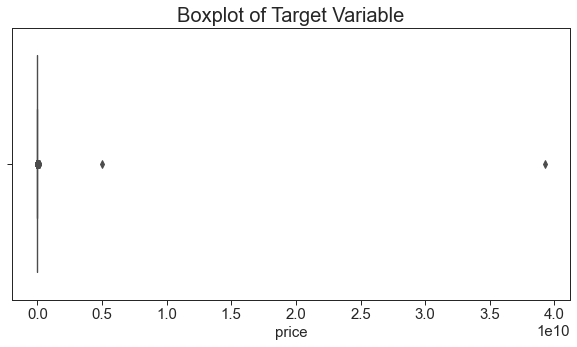

In [16]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(df_train_cleaned["price"]).set_title("Boxplot of Target Variable")

In [17]:
# Look into the two outliers
df_train_cleaned[df_train_cleaned["price"] > 0.4*10**10]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
5976,385586,hdb flat for sale in 238 compassvale walk,hougang / punggol / sengkang (d19),compassvale plains,hdb 4 rooms,99-year leasehold,1999.0,1.0,10.0,232,NaN,unspecified,"1, 3, 4 br",NaN,https://www.99.co/singapore/hdb/compassvale-pl...,1.390556,103.898921,0,sengkang town centre,sengkang,3.924243e+10
16264,287109,hdb flat for sale in 238 compassvale walk,hougang / punggol / sengkang (d19),compassvale plains,hdb 4 rooms,99-year leasehold,1999.0,1.0,10.0,129,NaN,unspecified,"1, 3, 4 br",NaN,https://www.99.co/singapore/hdb/compassvale-pl...,1.390556,103.898921,0,sengkang town centre,sengkang,4.985919e+09


- We see both transactions are HDB 4 rooms. It is highly unlikely that a HDB will be able to fetch that high value.
- We will remove the two outliers from our dataset

In [18]:
df_train_cleaned = df_train_cleaned[df_train_cleaned["price"] <= 0.4*10**10]

In [19]:
check_shape(df_train_cleaned)

There are 20252 data points and 21 features


- The distribution of price is very skewed. There might be outliers present. We will explore further in the bivaraite analysis section

Text(0.5, 1.0, 'Distribution of prices')

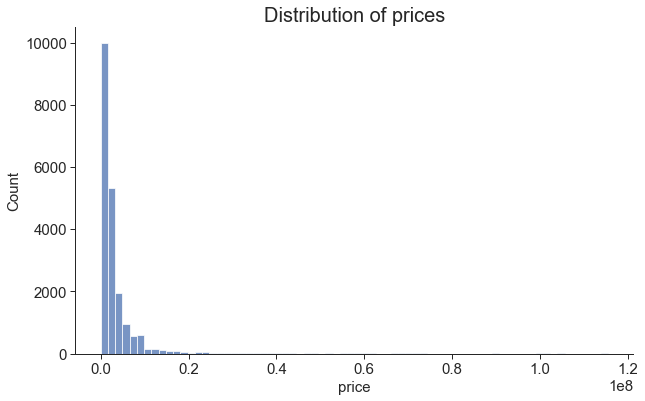

In [20]:
fig, ax = plt.subplots(figsize=(10,6))
sns.despine(fig)
ax = sns.histplot(df_train_cleaned["price"], 
             bins=70)
plt.title("Distribution of prices")

### Size Square Feet

c:\Users\joann\Anaconda3\envs\tensorflow-gpu\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Boxplot of Size_Sqft')

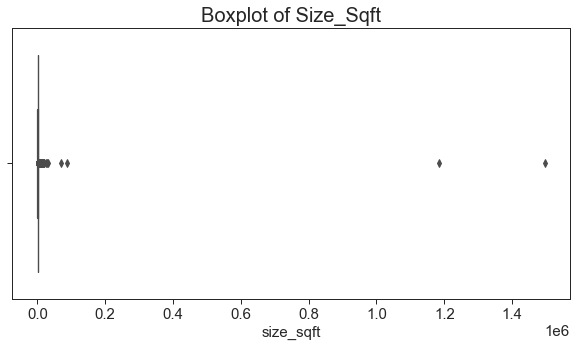

In [21]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(df_train_cleaned["size_sqft"]).set_title("Boxplot of Size_Sqft")

In [22]:
df_train_cleaned[df_train_cleaned["size_sqft"] > 1*10**6]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
2701,160293,3 bed condo for sale in jlb residences,169 jalan loyang besar,jlb residences,condo,946-year leasehold,2008.0,3.0,2.0,1185000,NaN,unfurnished,3 br,36.0,https://www.99.co/singapore/condos-apartments/...,1.379105,103.960613,0,pasir ris park,pasir ris,1244200.0
18446,771950,4 bed condo for sale in avenue south residence,1 silat avenue,avenue south residence,condo,99-year leasehold,2023.0,4.0,4.0,1496000,NaN,unspecified,"studio, 1, 2, 3, 4 br",1074.0,https://www.99.co/singapore/condos-apartments/...,1.304855,103.773776,0,dover,queenstown,3040800.0


In [23]:
df_train_cleaned[df_train_cleaned["property_type"] == "condo"]["size_sqft"].mean()

1495.311954459203

- Both data points have the same property type and we see that the mean size sqft for condo is 1495. 
- This makes those two data points outliers since their size_sqft deviates too far away from the mean of a typical condo.

In [24]:
# remove the two outliers
df_train_cleaned = df_train_cleaned[df_train_cleaned["size_sqft"] <= 1*10**6]

# remove data points with size_sfft == 0
df_train_cleaned = df_train_cleaned[df_train_cleaned["size_sqft"] != 0]

In [25]:
check_shape(df_train_cleaned)

There are 20249 data points and 21 features


### Built Year

<AxesSubplot:xlabel='built_year', ylabel='Count'>

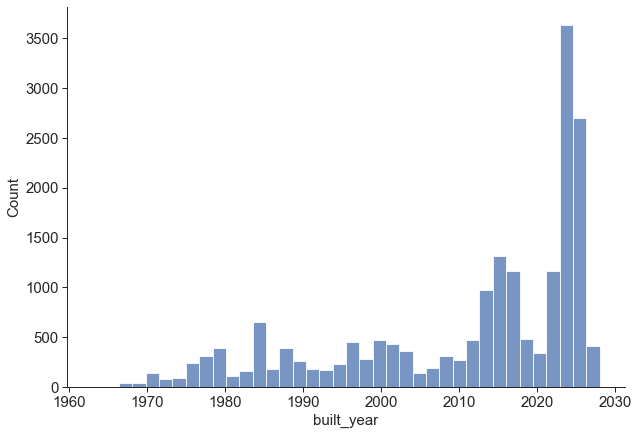

In [26]:
fig, ax = plt.subplots(figsize=(10,7))
sns.despine()
sns.histplot(df_train_cleaned["built_year"])

- There are units with built_year beyond our current year 2022 which is impossible. We will remove those from our dataset

In [27]:
df_train_cleaned[df_train_cleaned["built_year"] > 2022]["built_year"].value_counts()

2023.0    2153
2025.0    1533
2024.0    1476
2026.0    1162
2027.0     381
2028.0      31
Name: built_year, dtype: int64

In [28]:
df_train_cleaned = df_train_cleaned[df_train_cleaned["built_year"] <= 2022]

In [29]:
check_shape(df_train_cleaned)

There are 12591 data points and 21 features


### Tenure

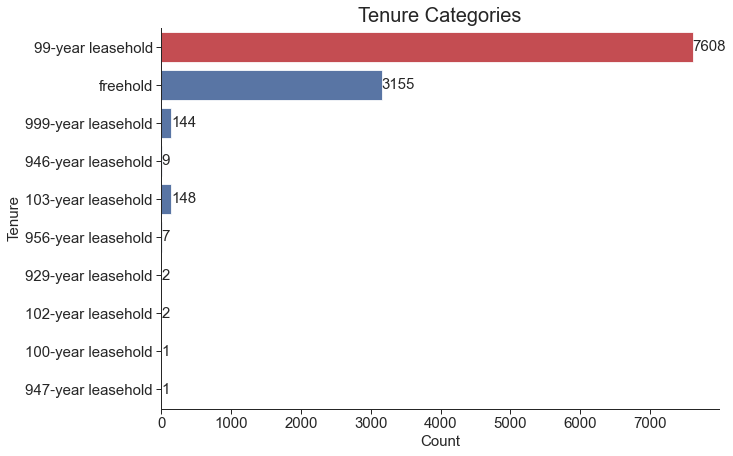

In [30]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="tenure", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal")
plt.title("Tenure Categories")
plt.xlabel("Count")
plt.ylabel("Tenure")
plt.show()

- Since there are only a few instances for many of the categories, we can consider grouping them

### Number of bedrooms

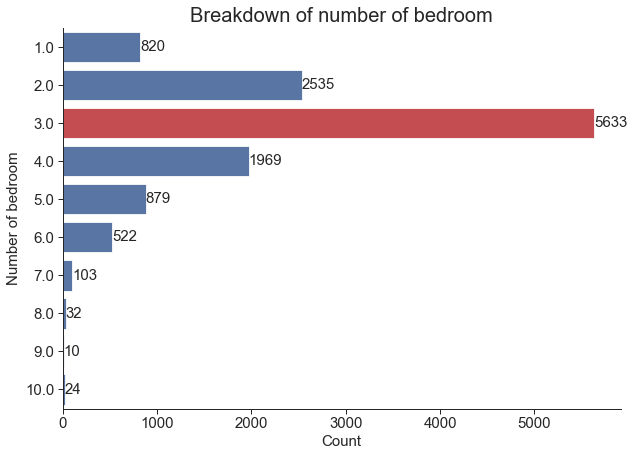

In [31]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="num_beds", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal")
plt.title("Breakdown of number of bedroom")
plt.xlabel("Count")
plt.ylabel("Number of bedroom")
plt.show()

### Number of Bathrooms

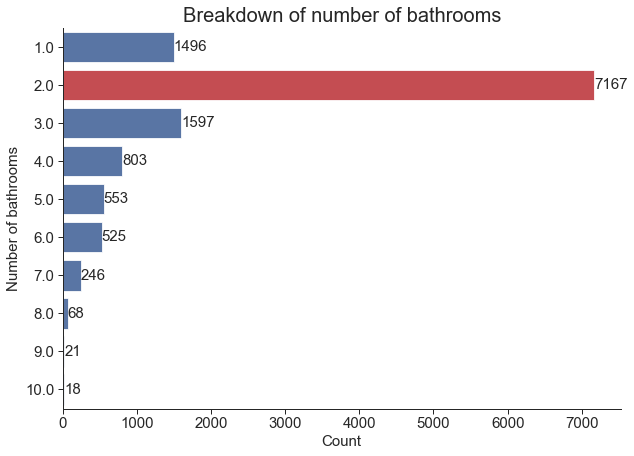

In [32]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.countplot(y="num_baths", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal")
plt.title("Breakdown of number of bathrooms")
plt.xlabel("Count")
plt.ylabel("Number of bathrooms")
plt.show()

### Property Type

- We have normalize ``property_type``.
- For HDB, we can remove the number of rooms under the ``property_type`` since the information about number of rooms can be represented as ``size_sqft``
- *Shophouse* are under the broader category *Walk-Up* so we will replace the category

In [33]:
def clean_property_type(data):
    
    data["property_type"] = data["property_type"].apply(lambda x: x.lower())
    pattern = re.compile(r'\d{1} room.')
    data["property_type"] = data["property_type"].apply(lambda x: pattern.sub('', x))
    data["property_type"] = data["property_type"].apply(lambda x: x.strip())
    data["property_type"] = data["property_type"].str.replace("land only", "landed")
    data["property_type"] = data["property_type"].str.replace("shophouse", "walk-up")
    return data
    

In [34]:
df_train_cleaned = clean_property_type(df_train_cleaned)

In [35]:
df_train_cleaned.head()

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
0,122881,hdb flat for sale in 866 yishun street 81,sembawang / yishun (d27),866 yishun street 81,hdb,NaN,1988.0,3.0,2.0,1115,NaN,unspecified,NaN,116.0,https://www.99.co/singapore/hdb/866-yishun-str...,1.414399,103.837196,0,yishun south,yishun,514500.0
1,259374,hdb flat for sale in 506b serangoon north aven...,hougang / punggol / sengkang (d19),hdb-serangoon estate,hdb,99-year leasehold,1992.0,4.0,2.0,1575,NaN,unspecified,"1, 2, 3, 4, 5, 6 br",NaN,https://www.99.co/singapore/hdb/hdbserangoon-e...,1.372597,103.875625,0,serangoon north,serangoon,995400.0
2,665422,4 bed condo for sale in meyerhouse,128 meyer road,meyerhouse,condo,freehold,2022.0,4.0,6.0,3070,low,partial,"studio, 3, 4, 5, 6 br",56.0,https://www.99.co/singapore/condos-apartments/...,1.298773,103.895798,0,mountbatten,marine parade,8485000.0
8,904428,1 bed condo for sale in stevens suites,2 stevens close,stevens suites,condo,freehold,2014.0,1.0,1.0,700,ground,unspecified,"1, 2, 3, 4 br",32.0,https://www.99.co/singapore/condos-apartments/...,1.315535,103.825684,0,nassim,tanglin,1312500.0
10,397777,2 bed condo for sale in bedok court,299 bedok south avenue 3,bedok court,condo,99-year leasehold,1985.0,2.0,NaN,1733,high,unspecified,"studio, 1, 2, 3, 4 br",280.0,https://www.99.co/singapore/condos-apartments/...,1.322153,103.945223,0,bedok south,bedok,2205000.0


### Latitude, Longitude

In [36]:
#create a map
this_map = folium.Map(prefer_canvas=True)

In [37]:
def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[point.lat, point.lng],
                        radius=2,
                        weight=5).add_to(this_map)

In [38]:
df_map = df_train_cleaned.loc[:,["lat", "lng"]]

#use df.apply(,axis=1) to "iterate" through every row in your dataframe
df_map.apply(plotDot, axis = 1)

#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
this_map.save('map_lat_long.html')

this_map

- There seemed to be 3 dirty coordinates.
- Singapore's latitude and longitude coordinates are (1.2902, 103.8519). We will identify which data points are very far off from the coordinates
- (69.486768, 20.184434) corresponds to the point located in Norway
- (38.942776, -77.065364) corresponds to the point located in USA
- (14.484814, 121.023232) corresponds to the point located in Philippines
- Coincidentally, these areas are without a planning area. Since we are unable to determine the correct lat, long and there are only 16 of such instances, we will drop these rows

In [39]:
dirty_lat_long = df_train_cleaned[(df_train_cleaned["lng"] < 103) | (df_train_cleaned["lng"] >= 104)]
dirty_lat_long

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
86,290007,1 bed condo for sale in pollen & bleu,15 farrer drive,pollen & bleu,condo,99-year leasehold,2017.0,1.0,1.0,549,NaN,unspecified,"1, 2, 3, 4, 5 br",106.0,https://www.99.co/singapore/condos-apartments/...,69.486768,20.184434,0,NaN,NaN,1470000.0
2765,103430,2 bed condo for sale in pollen & bleu,17 farrer drive,pollen & bleu,condo,99-year leasehold,2017.0,2.0,2.0,1163,NaN,fully,"1, 2, 3, 4, 5 br",106.0,https://www.99.co/singapore/condos-apartments/...,69.486768,20.184434,0,NaN,NaN,2362500.0
4792,466328,2 bed condo for sale in ness,38 lorong 32 geylang,ness,condo,freehold,2015.0,2.0,2.0,1100,NaN,unspecified,"studio, 1, 2 br",62.0,https://www.99.co/singapore/condos-apartments/...,38.942776,-77.065364,0,NaN,NaN,1680000.0
6393,272234,2 bed condo for sale in m5,5 jalan mutiara,m5,apartment,freehold,2017.0,2.0,1.0,775,low,partial,"1, 2 br",33.0,https://www.99.co/singapore/condos-apartments/m5,14.484814,121.023232,0,NaN,NaN,1772400.0
7207,806744,1 bed condo for sale in m5,5 jalan mutiara,m5,apartment,freehold,2017.0,1.0,1.0,441,NaN,unspecified,"1, 2 br",33.0,https://www.99.co/singapore/condos-apartments/m5,14.484814,121.023232,0,NaN,NaN,1100400.0
8806,820759,3 bed condo for sale in pollen & bleu,17 farrer drive,pollen & bleu,condo,99-year leasehold,2017.0,3.0,2.0,1184,low,unfurnished,"1, 2, 3, 4, 5 br",106.0,https://www.99.co/singapore/condos-apartments/...,69.486768,20.184434,0,NaN,NaN,2467500.0
9525,719023,2 bed condo for sale in ness,38 lorong 32 geylang,ness,condo,freehold,2015.0,2.0,2.0,1049,NaN,fully,"studio, 1, 2 br",62.0,https://www.99.co/singapore/condos-apartments/...,38.942776,-77.065364,0,NaN,NaN,1680000.0
9668,761837,1 bed condo for sale in ness,38 lorong 32 geylang,ness,condo,freehold,2015.0,1.0,1.0,517,penthouse,partial,"studio, 1, 2 br",62.0,https://www.99.co/singapore/condos-apartments/...,38.942776,-77.065364,0,NaN,NaN,765300.0
9893,849863,1 bed condo for sale in m5,5 jalan mutiara,m5,apartment,freehold,2017.0,1.0,1.0,473,NaN,unspecified,"1, 2 br",33.0,https://www.99.co/singapore/condos-apartments/m5,14.484814,121.023232,0,NaN,NaN,1110900.0
10274,723100,2 bed condo for sale in ness,38 lorong 32 geylang,ness,condo,freehold,2015.0,2.0,2.0,818,mid,unfurnished,"studio, 1, 2 br",62.0,https://www.99.co/singapore/condos-apartments/...,38.942776,-77.065364,0,NaN,NaN,1239000.0


In [40]:
check_shape(df_train_cleaned)

There are 12591 data points and 21 features


In [41]:
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_lat_long.index)].reset_index().drop("index", axis=1)

In [42]:
check_shape(df_train_cleaned)

There are 12575 data points and 21 features


### Planning Area

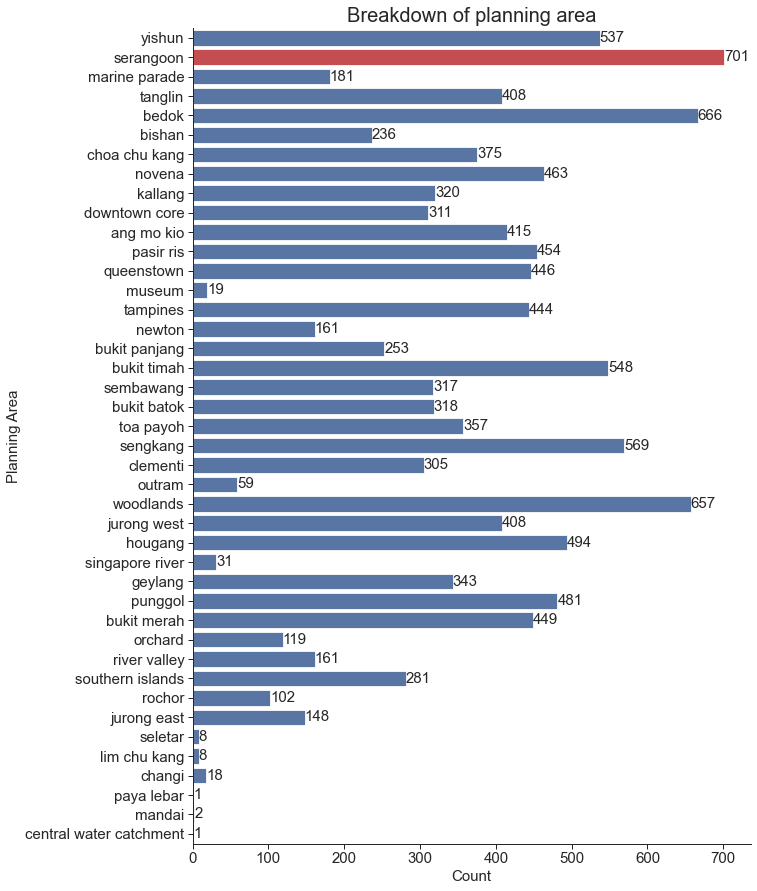

In [43]:
fig, ax = plt.subplots(figsize=(10,15))
ax = sns.countplot(y="planning_area", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal")
plt.title("Breakdown of planning area")
plt.xlabel("Count")
plt.ylabel("Planning Area")
plt.show()

### Furnishings

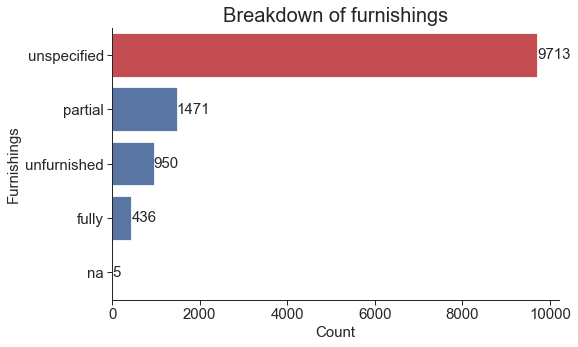

In [44]:
fig, ax = plt.subplots(figsize=(8,5))
ax = sns.countplot(y="furnishing", data=df_train_cleaned, color=default_col)
ax.bar_label(ax.containers[0], fontsize=15)
sns.despine()
highlight_top(ax, "horizontal")
plt.title("Breakdown of furnishings")
plt.xlabel("Count")
plt.ylabel("Furnishings")
plt.show()

### Total Number of Units

<AxesSubplot:xlabel='total_num_units', ylabel='Count'>

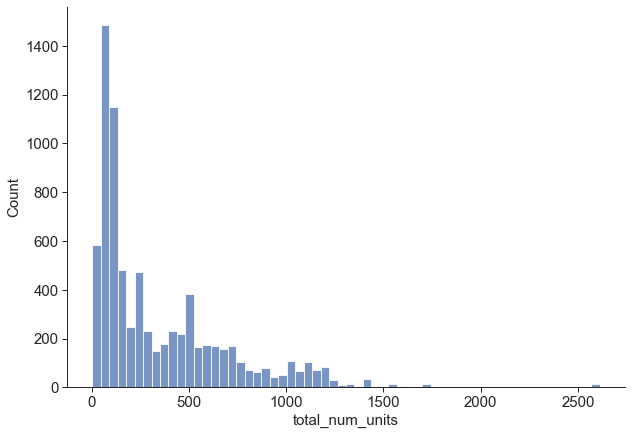

In [45]:
fig, ax = plt.subplots(figsize=(10,7))
sns.despine()
sns.histplot(df_train_cleaned["total_num_units"])

### Dropping columns that will not be useful

- ``listing_id``, ``title``, ``address``, ``property_name``, ``availbale_unit_types``, ``property_details_url`` can be dropped since these columns do not generally provide much value to the resale price
- In the above summary, we see that ``elevation`` has a mean and standard deviation of 0 which means all values are the same. Thus, we can remove this column since it does not contribute to the resale price.
- ``subzone`` has a lot more categories hence we will use the broader category ``planning_area`` instead.

In [46]:
cols_drop = ["listing_id", "title", "address", "property_name", "available_unit_types", "property_details_url", 
             "elevation", "subzone"]
df_train_cleaned = df_train_cleaned.drop(cols_drop, axis=1)

In [47]:
check_shape(df_train_cleaned)

There are 12575 data points and 13 features


In [48]:
df_train_cleaned.head()

,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,planning_area,price
0,hdb,NaN,1988.0,3.0,2.0,1115,NaN,unspecified,116.0,1.414399,103.837196,yishun,514500.0
1,hdb,99-year leasehold,1992.0,4.0,2.0,1575,NaN,unspecified,NaN,1.372597,103.875625,serangoon,995400.0
2,condo,freehold,2022.0,4.0,6.0,3070,low,partial,56.0,1.298773,103.895798,marine parade,8485000.0
3,condo,freehold,2014.0,1.0,1.0,700,ground,unspecified,32.0,1.315535,103.825684,tanglin,1312500.0
4,condo,99-year leasehold,1985.0,2.0,NaN,1733,high,unspecified,280.0,1.322153,103.945223,bedok,2205000.0


## 4.3 Bivariate Analysis

To identify potential outliers, we can look at two variables together.

### Relationship between size sqft and prices

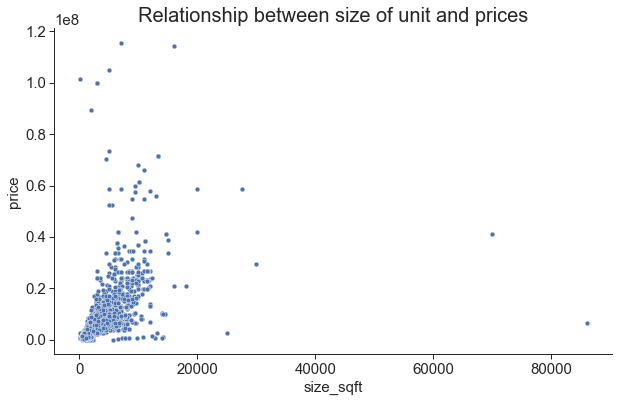

In [49]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="size_sqft", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between size of unit and prices")
plt.show()

- There are two points that are very far off from the rest.
- Looking at the median size_sqft for each property_type, it is not likely that these are valid size_sqft. 
- We will remove those two outliers.

In [50]:
dirty_size_sqft = df_train_cleaned[df_train_cleaned["size_sqft"] > 60000]
dirty_size_sqft

,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,planning_area,price
2643,semi-detached house,freehold,1970.0,6.0,7.0,86080,NaN,unspecified,NaN,1.306408,103.932790,bedok,6279000.0
9705,bungalow,freehold,1997.0,6.0,6.0,70000,NaN,unspecified,NaN,1.335877,103.789611,bukit timah,40950000.0


In [51]:
# median size_sqft for each property_type
df_train_cleaned.groupby("property_type")["size_sqft"].median()

property_type
apartment              1044.0
bungalow               7500.0
cluster house          3691.5
condo                   990.0
corner terrace         3300.0
executive condo        1152.0
good class bungalow    3000.0
hdb                    1022.0
hdb executive          1571.0
landed                 3195.0
semi-detached house    5069.0
terraced house         3014.0
townhouse              3853.0
walk-up                 759.0
Name: size_sqft, dtype: float64

In [52]:
check_shape(df_train_cleaned)

There are 12575 data points and 13 features


In [53]:
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_size_sqft.index)].reset_index()

In [54]:
check_shape(df_train_cleaned)

There are 12573 data points and 14 features


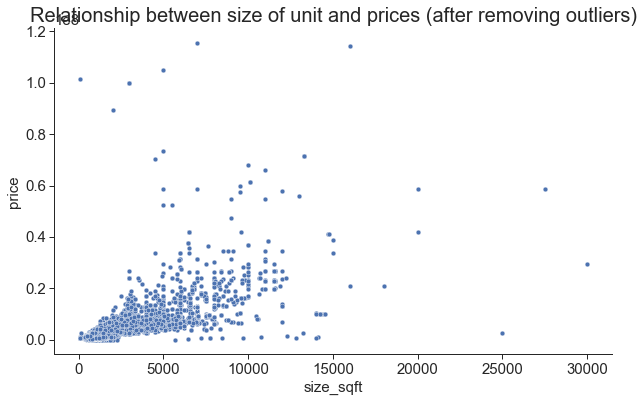

In [55]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="size_sqft", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between size of unit and prices (after removing outliers)")
plt.show()

- In general, there is positive correlation between the size of unit and the resale price as we would expect. Thus, this will be a strong feature for our model.

### Relationship between Tenure and Prices

In [56]:
df_train_cleaned.head()

,index,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,planning_area,price
0,0,hdb,NaN,1988.0,3.0,2.0,1115,NaN,unspecified,116.0,1.414399,103.837196,yishun,514500.0
1,1,hdb,99-year leasehold,1992.0,4.0,2.0,1575,NaN,unspecified,NaN,1.372597,103.875625,serangoon,995400.0
2,2,condo,freehold,2022.0,4.0,6.0,3070,low,partial,56.0,1.298773,103.895798,marine parade,8485000.0
3,3,condo,freehold,2014.0,1.0,1.0,700,ground,unspecified,32.0,1.315535,103.825684,tanglin,1312500.0
4,4,condo,99-year leasehold,1985.0,2.0,NaN,1733,high,unspecified,280.0,1.322153,103.945223,bedok,2205000.0


<AxesSubplot:xlabel='price', ylabel='tenure'>

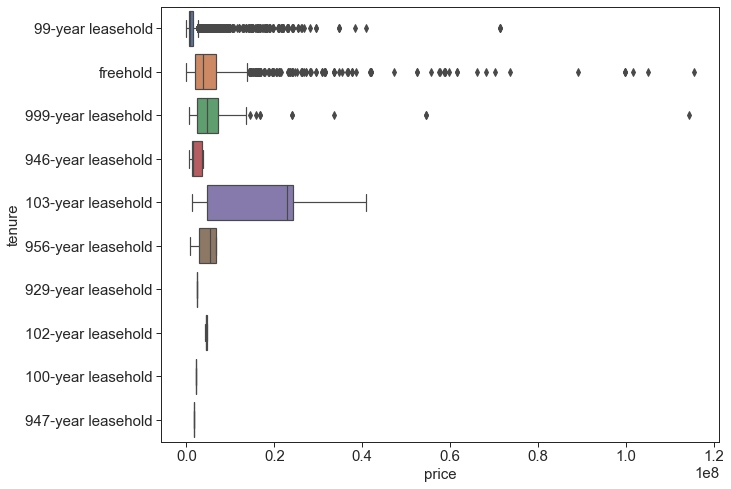

In [57]:
fig, ax = plt.subplots(figsize=(10,8))
sns.boxplot(x="price", y="tenure", data=df_train_cleaned)

- Under the 999 year leasehold, there is a data point that is very far off from the other points.
- Under the 99 year leasehold, there is also one data point that is very far off from the other points

In [58]:
dirty_tenure999_price = df_train_cleaned[(df_train_cleaned["tenure"] == "999-year leasehold") & (df_train_cleaned["price"] > 1*10**8)]
dirty_tenure999_price

,index,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,planning_area,price
11849,11851,bungalow,999-year leasehold,1989.0,10.0,10.0,16000,NaN,unspecified,NaN,1.317659,103.790578,bukit timah,114450000.0


In [59]:
dirty_tenure99_price = df_train_cleaned[(df_train_cleaned["tenure"] == "99-year leasehold") & (df_train_cleaned["price"] > 0.6*10**8)]
dirty_tenure99_price

,index,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,total_num_units,lat,lng,planning_area,price
448,448,condo,99-year leasehold,2011.0,5.0,NaN,13293,NaN,unfurnished,1129.0,1.266718,103.811493,bukit merah,71400000.0
1181,1181,condo,99-year leasehold,2011.0,5.0,NaN,13293,NaN,unfurnished,1129.0,1.266718,103.811493,bukit merah,71400000.0
6773,6774,condo,99-year leasehold,2011.0,5.0,NaN,13293,NaN,unfurnished,1129.0,1.266718,103.811493,bukit merah,71400000.0


- Comparing the same property type with same tenure, the above four data points are indeed outliers as they are very different from the usual prices.

In [60]:
df_999year = df_train_cleaned[df_train_cleaned["tenure"] == "999-year leasehold"]
df_99year = df_train_cleaned[df_train_cleaned["tenure"] == "99-year leasehold"]

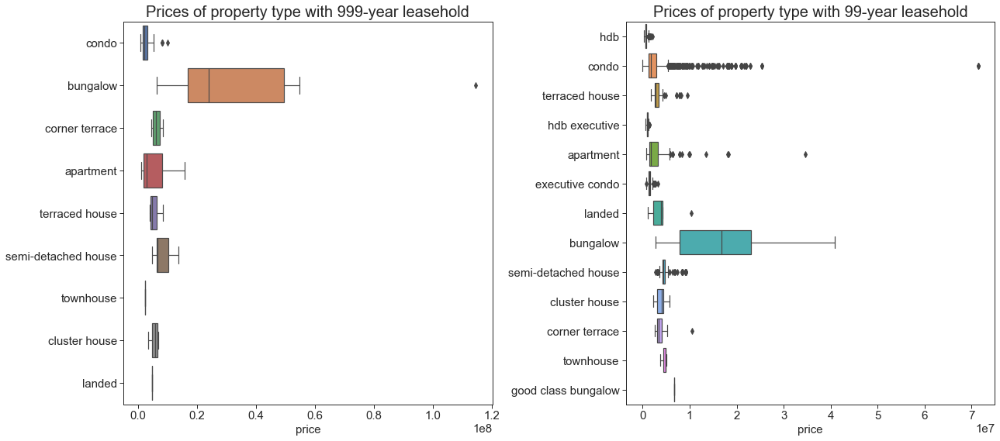

In [61]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))
sns.boxplot(x="price", y="property_type", data=df_999year, ax=ax1)
ax1.set_title('Prices of property type with 999-year leasehold')
ax1.set_ylabel('')
sns.boxplot(x="price", y="property_type", data=df_99year, ax=ax2)
ax2.set_title('Prices of property type with 99-year leasehold')
ax2.set_ylabel('')
plt.tight_layout()
plt.show()

In [62]:
check_shape(df_train_cleaned)

There are 12573 data points and 14 features


In [63]:
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_tenure999_price.index)]
df_train_cleaned = df_train_cleaned[~df_train_cleaned.index.isin(dirty_tenure99_price.index)]

In [64]:
check_shape(df_train_cleaned)

There are 12569 data points and 14 features


### Relationship between number of bedrooms and prices

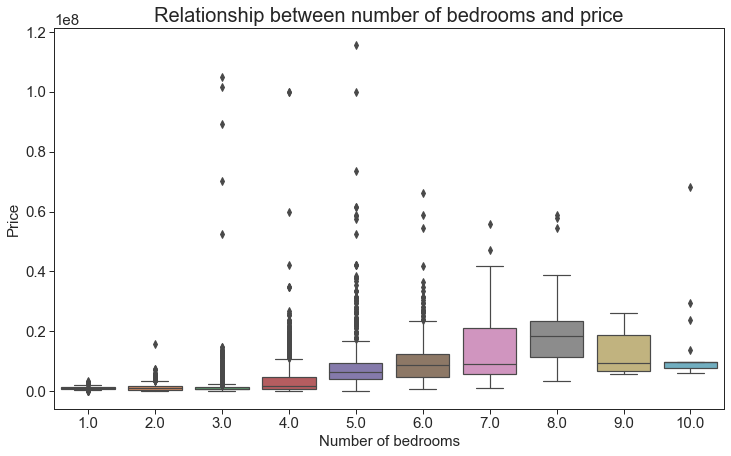

In [65]:
fig, ax = plt.subplots(figsize=(12,7))
sns.boxplot(x="num_beds", y="price", data=df_train_cleaned)
ax.set_xlabel("Number of bedrooms")
ax.set_ylabel("Price")
ax.set_title("Relationship between number of bedrooms and price")
plt.show()

- As the number of bedrooms increases, the higher the resale price

### Furnishings and Prices

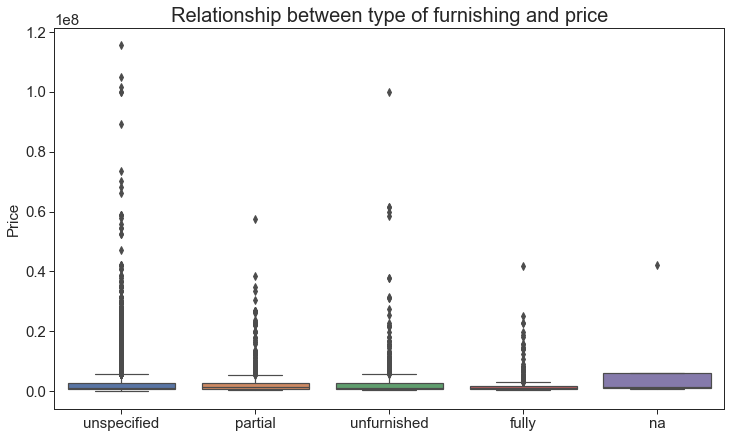

In [66]:
fig, ax = plt.subplots(figsize=(12,7))
sns.boxplot(x="furnishing", y="price", data=df_train_cleaned)
ax.set_xlabel("")
ax.set_ylabel("Price")
ax.set_title("Relationship between type of furnishing and price")
plt.show()

- The type of furnishing does not seem to have any clear pattern hence may not be useful for our model prediction

In [67]:
df_train_cleaned = df_train_cleaned.drop("furnishing", axis=1).reset_index().drop("index", axis=1)

### Relationship between total number of units and prices

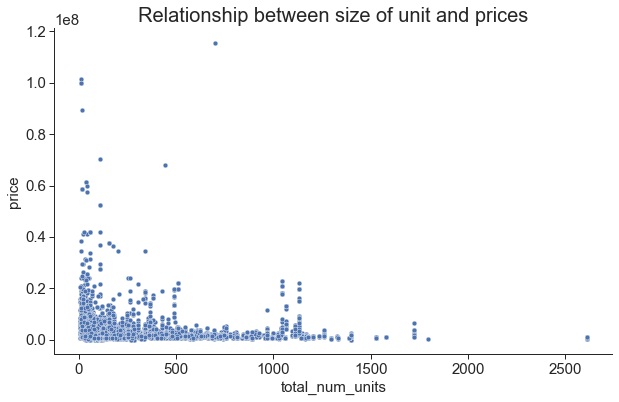

In [68]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.despine(fig,right=True)
sns.scatterplot(x="total_num_units", y="price",
                data=df_train_cleaned, ax=ax)
plt.title("Relationship between size of unit and prices")
plt.show()

- There is no clear pattern so ``total_num_units`` will not be very useful for our prediction

In [69]:
df_train_cleaned = df_train_cleaned.drop("total_num_units", axis=1).reset_index().drop("index", axis=1)

## Missing Value

In [70]:
df_train_cleaned.head()

,level_0,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,lat,lng,planning_area,price
0,0,hdb,NaN,1988.0,3.0,2.0,1115,NaN,1.414399,103.837196,yishun,514500.0
1,1,hdb,99-year leasehold,1992.0,4.0,2.0,1575,NaN,1.372597,103.875625,serangoon,995400.0
2,2,condo,freehold,2022.0,4.0,6.0,3070,low,1.298773,103.895798,marine parade,8485000.0
3,3,condo,freehold,2014.0,1.0,1.0,700,ground,1.315535,103.825684,tanglin,1312500.0
4,4,condo,99-year leasehold,1985.0,2.0,NaN,1733,high,1.322153,103.945223,bedok,2205000.0


<AxesSubplot:>

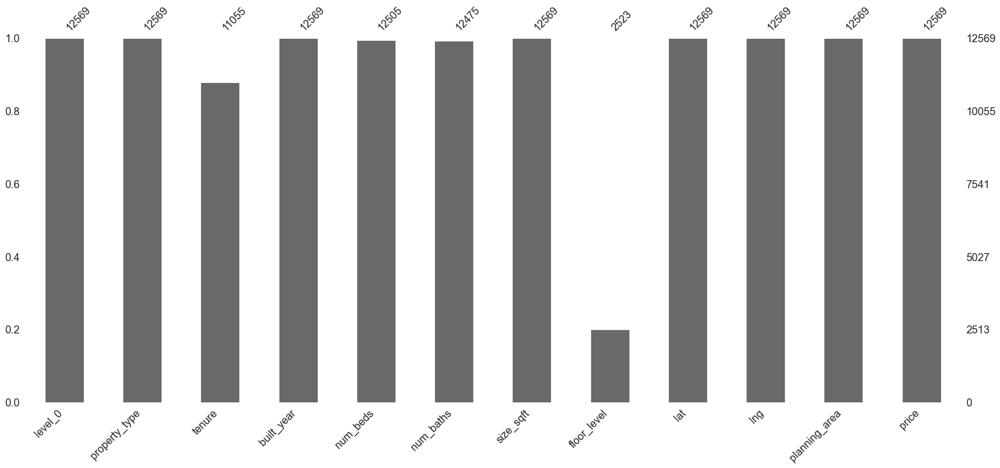

In [71]:
msno.bar(df_train_cleaned)

In [72]:
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [73]:
missing_values_table(df_train_cleaned)

Your selected dataframe has 12 columns.
There are 4 columns that have missing values.


,Missing Values,% of Total Values
floor_level,10046,79.9
tenure,1514,12.0
num_baths,94,0.7
num_beds,64,0.5


- We might have to drop ``floor_level`` as there are too many missing values.
- For ``tenure``, we can infer from the property type. We know that HDB has a tenure of 99 years.

In [126]:
df_train_cleaned = df_train_cleaned.drop("floor_level", axis=1)

In [105]:
lease_hdb = ["hdb", "hdb executive"]

In [114]:
df_train_cleaned["tenure"] = df_train_cleaned["tenure"].fillna(pd.Series(np.where((df_train_cleaned["property_type"].isin(lease_hdb)), "99-year leasehold", np.nan )))

In [115]:
df_train_cleaned.head()

,level_0,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,lat,lng,planning_area,price
0,0,hdb,99-year leasehold,1988.0,3.0,2.0,1115,NaN,1.414399,103.837196,yishun,514500.0
1,1,hdb,99-year leasehold,1992.0,4.0,2.0,1575,NaN,1.372597,103.875625,serangoon,995400.0
2,2,condo,freehold,2022.0,4.0,6.0,3070,low,1.298773,103.895798,marine parade,8485000.0
3,3,condo,freehold,2014.0,1.0,1.0,700,ground,1.315535,103.825684,tanglin,1312500.0
4,4,condo,99-year leasehold,1985.0,2.0,NaN,1733,high,1.322153,103.945223,bedok,2205000.0


- We will then drop the remaining nan ``property_type``

In [117]:
check_shape(df_train_cleaned)

There are 12569 data points and 12 features


In [119]:
df_train_cleaned = df_train_cleaned[df_train_cleaned["tenure"] != "nan"]

- Since there are only a few missing values for number of bedroom and number of baths, we will just drop them

In [124]:
# num_baths, num_beds
df_train_cleaned = df_train_cleaned[pd.notnull(df_train_cleaned["num_beds"])]
df_train_cleaned = df_train_cleaned[pd.notnull(df_train_cleaned["num_baths"])]

In [127]:
missing_values_table(df_train_cleaned)

Your selected dataframe has 11 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


# Data Preprocessing

- Remaining lease
- Total number of rooms